In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

def plot_station_with_map(df, coarse_grain_coff, delay=0, title_suffix="",vmax = 1,vmin = 0):
    # 1. 数据对齐（保持原逻辑）
    if isinstance(coarse_grain_coff, np.ndarray):
        coff_df = pd.DataFrame(coarse_grain_coff)
    else:
        coff_df = coarse_grain_coff.reset_index(drop=True)

    global_vmin = vmin
    global_vmax = vmax

    for col_idx in coff_df.columns:
        df_plot = df.copy()
        df_plot['value_to_plot'] = coff_df[col_idx].values
        df_plot = df_plot.sort_values('value_to_plot')

        fig = plt.figure(figsize=(9, 6),dpi=600)
        ax = plt.axes(projection=ccrs.PlateCarree())

        extent = [
            df_plot['lon'].min() - 0.3, df_plot['lon'].max() + 0.3,
            df_plot['lat'].min() - 0.3, df_plot['lat'].max() + 0.3
        ]
        ax.set_extent(extent, crs=ccrs.PlateCarree())

        ax.add_feature(cfeature.LAND, facecolor='#fdfcf0')
        ax.add_feature(cfeature.OCEAN, facecolor='#e3f2fd')
        ax.add_feature(cfeature.COASTLINE, linewidth=1)
        ax.add_feature(cfeature.LAKES, alpha=0.5)
        ax.add_feature(cfeature.RIVERS, linewidth=0.8)
        ax.add_feature(cfeature.STATES.with_scale('10m'),linestyle='--',edgecolor='grey')
        
        sc = ax.scatter(
            df_plot["lon"],df_plot["lat"],c=df_plot["value_to_plot"],
            cmap='viridis',vmin=global_vmin,vmax=global_vmax,
            s=60,alpha=1.0,edgecolors='black',linewidth=0.4,
            transform=ccrs.PlateCarree(),zorder=5)

        cbar = plt.colorbar(sc, fraction=0.035, pad=0.04)
        #cbar.set_label('Value', fontsize=20)
        cbar.ax.tick_params(labelsize=20)

        plt.title(f"y{col_idx}_d{delay}{title_suffix}",fontsize=20)

        gl = ax.gridlines(draw_labels=True, linestyle=':', alpha=0.6)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 20}
        gl.ylabel_style = {'size': 20}
        plt.show()

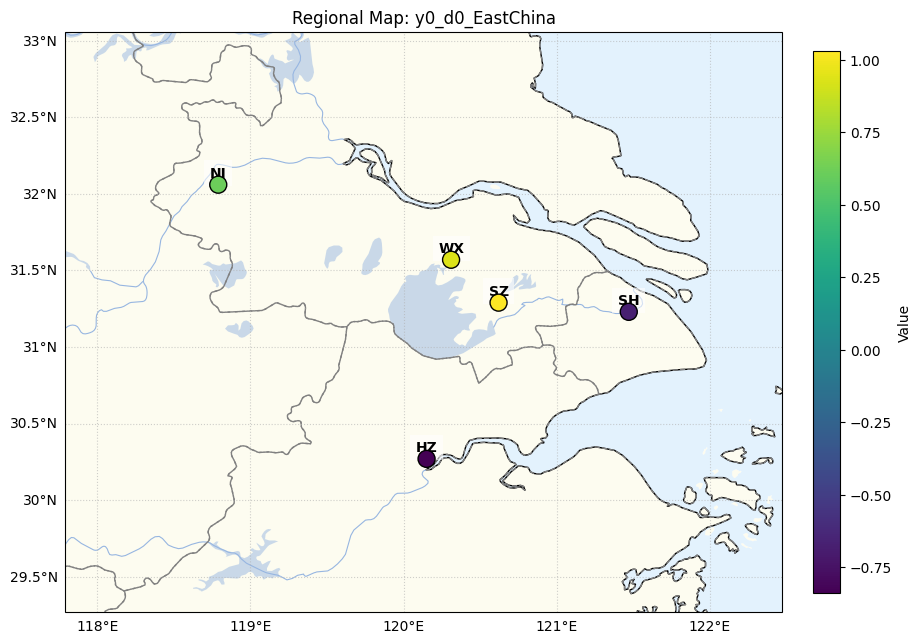

In [15]:
# 调用测试
plot_station_with_map(df_test, coarse_grain_coff_test, title_suffix="_EastChina")

In [2]:
import xarray as xr
import numpy as np
import os
import h5py

# 1. 路径设置 (保持你之前的路径)
file_path = r'E:\Jupyter集\mypykoop\pykoop\data_generators\dataset_yrd.nc'

# 2. 读取数据
# ds = xr.open_dataset(file_path,engine = 'scipy')
# 自动选择引擎（推荐）
# ds = xr.open_dataset(file_path)
# 明确指定 netcdf4 引擎
# ds = xr.open_dataset(file_path, engine='netcdf4')
ds = xr.open_dataset(file_path, engine='h5netcdf') 

# --- A. 基础信息输出 ---
print("=== 维度信息 ===")
print(f"时间维度 (time): {ds.sizes['time']}")
print(f"站点维度 (station): {ds.sizes['station']}")

# 获取所有变量名 (PM2.5, O3, t2m, etc.)
var_names = list(ds.data_vars)
print(f"\n包含的变量: {var_names}")


# 如果你想把所有变量堆叠成一个大数组用于训练模型
all_data_list = []
for var in var_names:
    all_data_list.append(ds[var].values)

# stack 堆叠: axis=-1 表示在最后一个维度增加变量维
# 结果形状: (70128, 127, 10)
full_time_series_array = np.stack(all_data_list, axis=-1)

print(f"\n=== 最终合并的时间序列数组 ===")
print(f"Shape: {full_time_series_array.shape}")
print("含义: (时间步, 站点数, 特征变量数)")
print(f"其中特征顺序对应: {var_names}")

ds.close()

=== 维度信息 ===
时间维度 (time): 70128
站点维度 (station): 127

包含的变量: ['PM2.5', 'O3', 't2m', 'd2m', 'sp', 'tp', 'blh', 'msdwswrf', 'u100', 'v100']

=== 最终合并的时间序列数组 ===
Shape: (70128, 127, 10)
含义: (时间步, 站点数, 特征变量数)
其中特征顺序对应: ['PM2.5', 'O3', 't2m', 'd2m', 'sp', 'tp', 'blh', 'msdwswrf', 'u100', 'v100']


# 数据展示

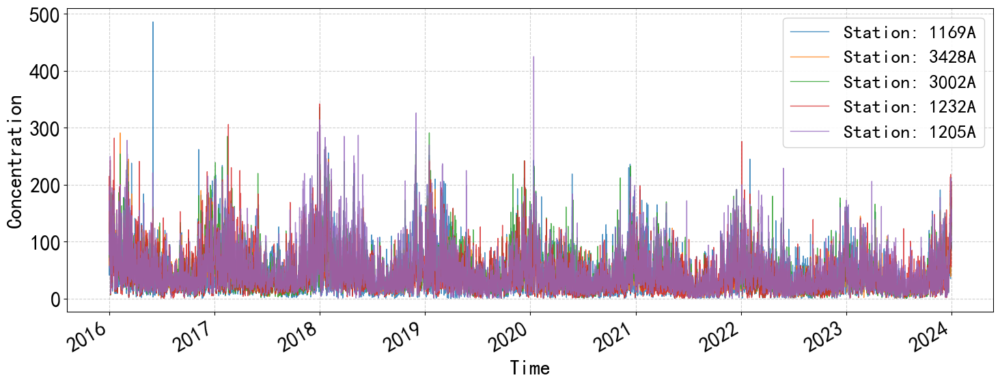

In [3]:
import matplotlib.pyplot as plt
import numpy as np

num_stations_to_plot = 5
pm25 = ds['PM2.5']
o3 = ds['O3']
times = ds['time'].values
stations = ds['station'].values

np.random.seed(42)
selected_indices = np.random.choice(len(stations), num_stations_to_plot, replace=False)

plt.rcParams['font.family'] = ['SimHei', 'DejaVu Sans']  # 兼容中文+英文显示
plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示异常问题

# 2. 调整画布尺寸，优化布局空间
plt.figure(figsize=(15, 6)) 

# 循环绘制选定站点的曲线
for idx in selected_indices:
    station_name = stations[idx]
    station_data_o3 = o3.isel(station=idx).values
    station_data_pm25 = pm25.isel(station=idx).values
    
    # 3. 优化曲线样式：加粗线条、提升透明度对比度、增加线条辨识度
    plt.plot(times, station_data_pm25, label=f'Station: {station_name}', alpha=0.8, linewidth=1)

# 4. 添加并美化标题：设置字号、加粗、增加间距
#plt.title('各监测站点PM2.5浓度时间序列', fontsize=26, fontweight='bold', pad=20)

plt.ylabel('Concentration', fontsize=22, fontweight='bold', labelpad=5)
plt.xlabel('Time', fontsize=22, fontweight='bold', labelpad=5)

# 6. 美化坐标轴刻度：调整刻度文字大小、加粗，适配整体样式
plt.xticks(fontsize=22, fontweight='medium')  # x轴刻度字号、中等加粗
plt.yticks(fontsize=22, fontweight='medium')  # y轴刻度字号、中等加粗

# 7. 美化图例：增大字号、调整边框、优化位置与内边距
plt.legend(loc='upper right',fontsize=20,frameon=True,fancybox=True,framealpha=0.9)    # 边框透明度

# 8. 优化网格样式：调整线型、粗细、透明度，弱化干扰
plt.grid(True, linestyle='--', alpha=0.6, linewidth=0.8)

# 9. 优化时间轴旋转角度，防止标签重叠（原逻辑保留，微调参数）
plt.gcf().autofmt_xdate(rotation=30, ha='right')  # 旋转30度，右对齐，避免重叠
# 10. 调整图表内边距，防止标签被裁剪
plt.tight_layout(pad=2.0)

plt.show()

In [4]:
cmap = plt.cm.Blues

# 算法处理

In [5]:
import sys
import os
sys.path.append(os.path.abspath('..')) 

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
import pysindy as ps 
from sklearn.linear_model import Lasso
from tools.tools import get_positive_contributions, compute_entropy, print_equations, fit_sindy_sr3_robust, lift_time_delay, plot_station
from tools.tools import split_and_group_matrices, plot_macro_serie
import warnings
from sklearn.exceptions import ConvergenceWarning

# 仅忽略收敛警告
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [6]:
x_data = np.column_stack((pm25.values, o3.values))
df = pd.read_csv('../data_generators/stations_yrd.csv')
micro_name0 = list(df["station_id"]) * 2
micro_name1 = ['_pm25'] * 127 + ['_o3'] * 127
micro_name = [a + b for a, b in zip(micro_name0, micro_name1)]
x_data.shape

(70128, 254)

In [7]:
ide = ps.IdentityLibrary()
n_delays = 2
delay_interval = 24
H, new_names = lift_time_delay(x_data, feature_names=micro_name, n_delays=n_delays, delay_interval=delay_interval)
H.shape, new_names

((70080, 762),
 ['1141A_pm25',
  '1142A_pm25',
  '1143A_pm25',
  '1144A_pm25',
  '1145A_pm25',
  '1147A_pm25',
  '1148A_pm25',
  '1149A_pm25',
  '1150A_pm25',
  '1151A_pm25',
  '1152A_pm25',
  '1153A_pm25',
  '1154A_pm25',
  '1155A_pm25',
  '1156A_pm25',
  '1157A_pm25',
  '1158A_pm25',
  '1159A_pm25',
  '1160A_pm25',
  '1162A_pm25',
  '1163A_pm25',
  '1164A_pm25',
  '1165A_pm25',
  '1166A_pm25',
  '1167A_pm25',
  '1168A_pm25',
  '1169A_pm25',
  '1170A_pm25',
  '1171A_pm25',
  '1172A_pm25',
  '1186A_pm25',
  '1188A_pm25',
  '1189A_pm25',
  '1190A_pm25',
  '1191A_pm25',
  '1192A_pm25',
  '1193A_pm25',
  '1194A_pm25',
  '1195A_pm25',
  '1196A_pm25',
  '1200A_pm25',
  '1201A_pm25',
  '1203A_pm25',
  '1204A_pm25',
  '1205A_pm25',
  '1206A_pm25',
  '1207A_pm25',
  '1209A_pm25',
  '1223A_pm25',
  '1224A_pm25',
  '1226A_pm25',
  '1227A_pm25',
  '1228A_pm25',
  '1230A_pm25',
  '1231A_pm25',
  '1232A_pm25',
  '1233A_pm25',
  '1234A_pm25',
  '1235A_pm25',
  '1236A_pm25',
  '1239A_pm25',
  '1240A_

In [40]:
discrete_time = True
dt = 1
thresholds = 2 * np.logspace(-8, 1, 2)
print(thresholds)
model, results = fit_sindy_sr3_robust(H, ide, new_names, penalty='l1', discrete_time=discrete_time, max_iter=300, thresholds=thresholds, metric='bic', tol=1e-4, nu=1)

[2.e-08 2.e+01]
开始使用 L1 范数扫描 2 个参数...


100%|████████████████████████████████████████████████████████████████████████████████| 2/2 [1:10:03<00:00, 2101.85s/it]



最佳模型 (bic) | Penalty: l1
Param (Thr/Lam): 2.000e+01
Test MSE: 9.6620e+01
Complexity: 34569
(1141A_pm25)[k+1] = 0.562 1141A_pm25[k] + 0.072 1143A_pm25[k] + 0.072 1145A_pm25[k] + 0.049 1147A_pm25[k] + 0.028 1148A_pm25[k] + 0.008 1164A_pm25[k] + 0.012 1166A_pm25[k] + 0.018 1167A_pm25[k] + 0.040 1169A_pm25[k] + 0.022 1171A_pm25[k] + -0.027 1233A_pm25[k] + 0.069 3265A_pm25[k] + 0.019 3266A_pm25[k] + 0.017 3268A_pm25[k] + 0.016 3270A_pm25[k] + 0.004 3273A_pm25[k]
(1142A_pm25)[k+1] = 0.642 1142A_pm25[k] + 0.056 1143A_pm25[k] + 0.110 1145A_pm25[k] + 0.007 1147A_pm25[k] + 0.031 1148A_pm25[k] + -0.005 1149A_pm25[k] + 0.039 1150A_pm25[k] + 0.020 1166A_pm25[k] + 0.035 1169A_pm25[k] + 0.002 1170A_pm25[k] + 0.017 1171A_pm25[k] + 0.022 3265A_pm25[k] + 0.025 3266A_pm25[k]
(1143A_pm25)[k+1] = 0.018 1141A_pm25[k] + 0.642 1143A_pm25[k] + 0.125 1145A_pm25[k] + 0.034 1148A_pm25[k] + 0.021 1166A_pm25[k] + 0.041 1169A_pm25[k] + 0.009 1170A_pm25[k] + 0.046 1171A_pm25[k] + -0.025 1233A_pm25[k] + 0.036 3265A_p

In [41]:
for r in results:
    print('thr', r['thr'])
    print('lam', r['lam'])
    print('mse', r['mse'])
    print('score', r['score'])

thr 20.0
lam 20.0
mse 96.62039313056444
score 394127.4401652365
thr 2e-08
lam 2e-08
mse 122.72904385522341
score 5602136.920366391


In [42]:
model.score(H, t=dt)

0.933433918998814

In [43]:
# model = results[0]['model']
# model.score(H, t=dt)

In [44]:
step_pred = 5
t = range(step_pred)
init_data = H[0,:]

if discrete_time:
    X_data_predicted = model.simulate(init_data,step_pred)
else:
    X_data_predicted = model.simulate(init_data,t) 

X_data_predicted.shape

(5, 762)

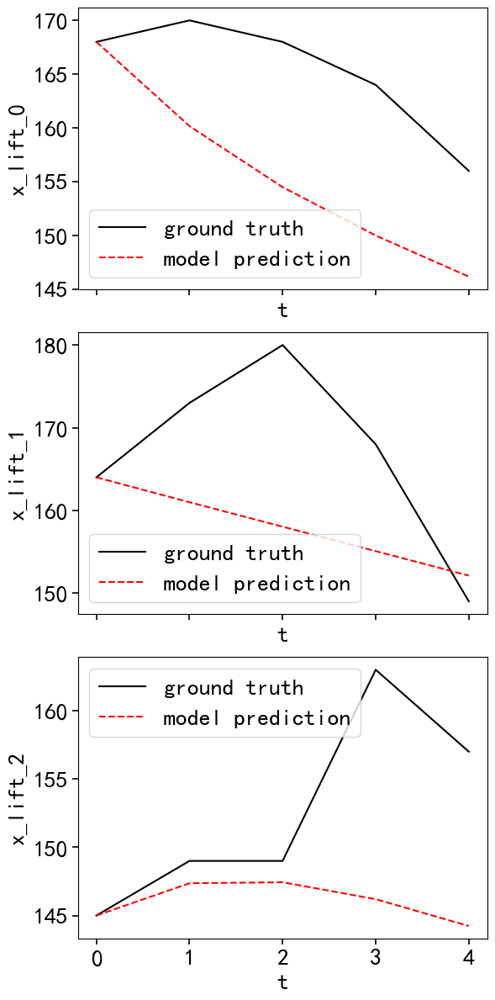

In [45]:
# 只看部分维度的多步预测
fig, axs = plt.subplots(3, 1, sharex=True, figsize=(6, 12))
fig.tight_layout(rect=[0, 0.03, 1, 0.97], pad=3.0)
for i in range(3):
    axs[i].plot(H[:step_pred, i], "k", label="ground truth")
    axs[i].plot(X_data_predicted[:step_pred, i], "r--", label="model prediction")
    axs[i].legend(fontsize=20,frameon=True, fancybox=True)
    axs[i].set_xlabel("t", fontsize=20, fontweight="bold", labelpad=5)
    axs[i].set_ylabel(f"x_lift_{i}", fontsize=20, fontweight="bold", labelpad=5)
    axs[i].tick_params(axis='both',labelsize=20,width=1.2, length=5)
    axs[i].tick_params(axis='both', labelrotation=0)
    for label in axs[i].get_xticklabels() + axs[i].get_yticklabels():
        label.set_fontweight('medium')
plt.tight_layout()
plt.show()

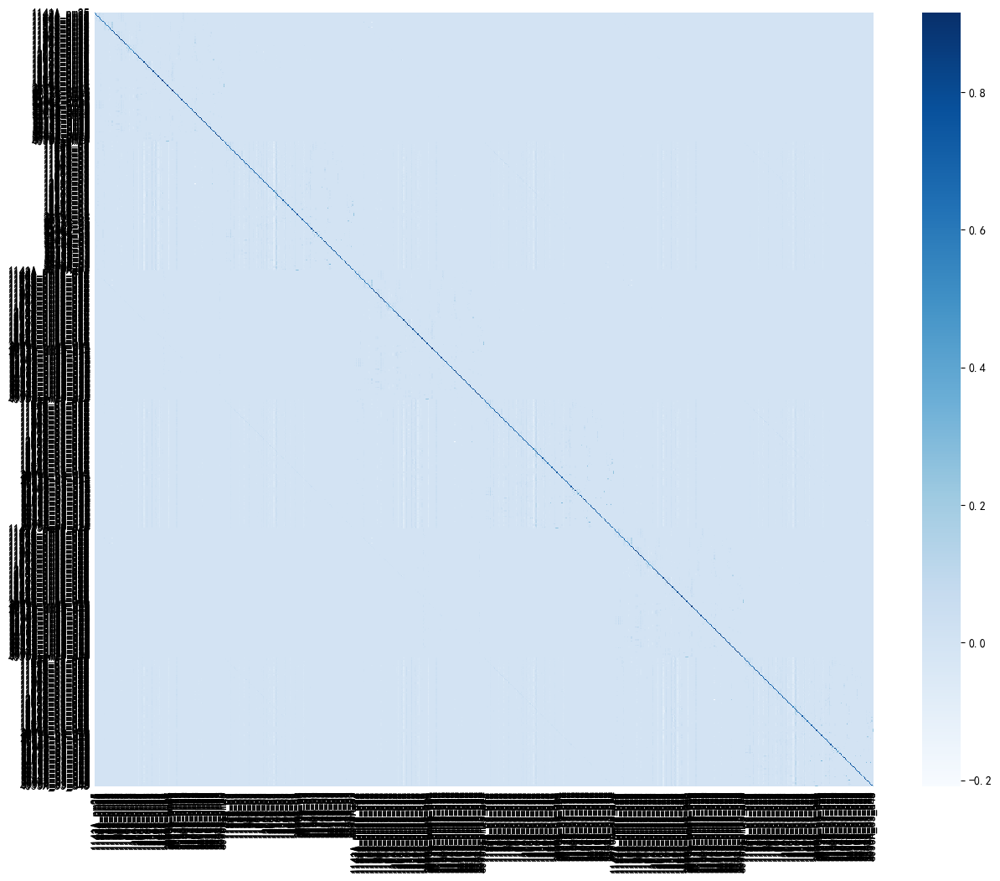

In [46]:
# 提取和处理系数矩阵
A = model.coefficients()
if discrete_time==False:
    A = scipy.linalg.expm(A)

# 只设置参数，不自动显示全部
plt.figure(figsize=(15, 12)) # 把画布搞大一点
plt.tick_params(axis='both', which='both', length=0)
_ = sns.heatmap(A, xticklabels=new_names, yticklabels=new_names,cmap=cmap)
# 旋转横轴标签，避免重叠
plt.xticks(rotation=90)  # 旋转90度
plt.yticks(rotation=0)   # 纵轴保持水平
plt.show()

In [47]:
U,S,V = np.linalg.svd(A)

C:\Users\Administrator.DESKTOP-BFUOLPM\AppData\Local\Temp\ipykernel_36204\3003482953.py:120: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


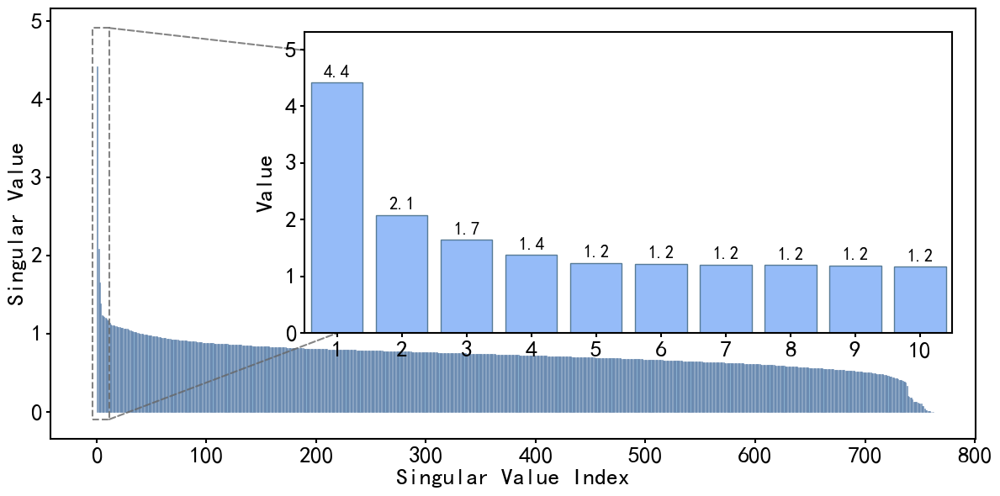

In [48]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Rectangle, ConnectionPatch

# 创建图形，设置图形大小（宽度15英寸，高度6英寸）
plt.figure(figsize=(12, 6))

# 主图 - 绘制全部奇异值的柱状图
# 颜色改为浅蓝色 (#8AB4F8) 用于主图
bars = plt.bar(np.arange(1, len(S)+1), S, 
               color='#6C9BC4', edgecolor='#5C7CA5', alpha=0.8, linewidth=0.5)

# 设置主图坐标轴标签 - 增大字体和加粗
plt.xlabel('Singular Value Index', fontsize=20, fontweight='bold', labelpad=3)  # 标签字体大小18，加粗，与坐标轴距离10点
plt.ylabel('Singular Value', fontsize=20, fontweight='bold', labelpad=3)  # 标签字体大小18，加粗，与坐标轴距离10点
#plt.title('Singular Value Spectrum with Zoomed View', fontsize=20, fontweight='bold', pad=20)  # 标题字体大小20，加粗，与图形顶部距离20点

# 移除主图网格线
plt.grid(False)

# 获取当前坐标轴对象
ax_main = plt.gca()

# 设置主图边框样式
for spine in ax_main.spines.values():
    spine.set_color('black')  # 边框颜色为黑色
    spine.set_linewidth(1.5)  # 边框线宽1.5
    spine.set_visible(True)  # 确保所有边框都显示

# 设置主图坐标轴刻度标签样式
ax_main.tick_params(axis='both', which='major', labelsize=20, width=1.5)  # 刻度标签大小16，刻度线宽1.5

# 在右上角创建放大图（内插图）- 占比70%
n = 10  # 设置放大前10个奇异值，修改此值可改变放大数量
# 创建内嵌坐标轴，宽度和高度占主图的70%
# borderpad=4 表示内嵌图与主图边缘的间距为4点
ax_inset = inset_axes(ax_main, 
                      width="70%",   # 内插图宽度占主图的70%，减小此值可缩小放大图
                      height="70%",  # 内插图高度占主图的70%，减小此值可缩小放大图
                      loc='upper right',  # 位于主图右上角
                      borderpad=2)   # 与主图边缘的间距为4点，增大此值可使放大图更靠近中心

# 绘制放大图 - 使用深蓝色 (#6C9BC4) 用于放大图
bars_inset = ax_inset.bar(np.arange(1, n+1), S[:n], 
                          color='#8AB4F8', edgecolor='#4A708B', alpha=0.9, linewidth=1)  # 深蓝色柱状图
ax_inset.set_xlim(0.5, n+0.5)  # 设置x轴范围为0.5到n+0.5，确保柱状图居中显示

# 设置放大图y轴范围
y_max = max(S[:n])+0.5  # 获取放大区域的最大值
ax_inset.set_ylim(0, y_max * 1.08)  # 设置y轴范围，上方留20%的空白区域，修改1.2可调整空白比例

# 设置放大图坐标轴标签
# ax_inset.set_xlabel(f'Index (1-{n})', fontsize=16, fontweight='bold', labelpad=8)  # 已被注释的x轴标签
ax_inset.set_ylabel('Value', fontsize=20, labelpad=8)  # y轴标签，字体大小16，加粗
#ax_inset.set_title(f'Zoom: First {n} Singular Values', fontsize=18, fontweight='bold', pad=15)  # 标题，字体大小18，加粗

# 设置放大图x轴刻度
ax_inset.set_xticks(np.arange(1, n+1))  # 设置x轴刻度位置为1到n
ax_inset.tick_params(axis='both', labelsize=20, width=1.5)  # 刻度标签大小15，刻度线宽1.5

# 移除放大图的网格线
ax_inset.grid(False)

# 设置放大图边框样式
for spine in ax_inset.spines.values():
    spine.set_color('black')  # 边框颜色为黑色
    spine.set_linewidth(1.5)  # 边框线宽1.5

# 设置背景颜色为纯白色
ax_main.set_facecolor('white')  # 主图背景色
ax_inset.set_facecolor('white')  # 放大图背景色

# 在放大图上添加数值标签
for i, (bar, v) in enumerate(zip(bars_inset, S[:n]), 1):
    height = bar.get_height()  # 获取柱状图高度
    # 在柱状图顶部添加数值标签
    ax_inset.text(bar.get_x() + bar.get_width()/2., height + y_max*0.01, 
                  f'{v:.1f}', ha='center', va='bottom', fontsize=15, fontweight='bold')

# 在主图上绘制虚线框标记放大区域
rect_padding = 0.2  # 虚线框的边距大小，增大此值可增加虚线框与柱状图的间距
# 设置虚线框的x坐标范围，-3.5到n+1.5确保框住前n个柱状图并有足够边距
rect_x = [-3.5 - rect_padding, n+1.5 + rect_padding]  # x范围，减小-3.5可使框左移，增大n+1.5可使框右移
rect_y = [-y_max*0.02, max(S[:n]) + y_max*0.1]  # y范围，修改-0.02和0.1可调整上下边距

# 创建黑灰色虚线框
rect = Rectangle((rect_x[0], rect_y[0]),  # 矩形左下角坐标
                 rect_x[1] - rect_x[0],  # 矩形宽度
                 rect_y[1] - rect_y[0],  # 矩形高度
                 linewidth=1.5, linestyle='--',  # 线宽1.5，虚线样式
                 edgecolor='#666666',  # 边框颜色为深灰色
                 facecolor='none',  # 无填充色
                 alpha=0.8, zorder=10)  # 透明度0.8，图层层级10（确保在最上层）
ax_main.add_patch(rect)  # 将矩形添加到主图

# 添加第一条连接线：从虚线框右下角到放大图左下角
con1 = ConnectionPatch(
    xyA=(rect_x[1], rect_y[0]),  # 起点：虚线框右下角
    xyB=(1, 0),  # 终点：放大图左下角
    coordsA="data", coordsB="data",  # 使用数据坐标
    axesA=ax_main, axesB=ax_inset,  # 连接主图和放大图
    color="#666666", linestyle="--", linewidth=1.5, alpha=0.8  # 深灰色虚线
)

# 添加第二条连接线：从虚线框右上角到放大图左上角
con2 = ConnectionPatch(
    xyA=(rect_x[1], rect_y[1]),  # 起点：虚线框右上角
    xyB=(1, y_max),  # 终点：放大图左上角
    coordsA="data", coordsB="data",  # 使用数据坐标
    axesA=ax_main, axesB=ax_inset,  # 连接主图和放大图
    color="#666666", linestyle="--", linewidth=1.5, alpha=0.8  # 深灰色虚线
)

# 将连接线添加到主图
ax_main.add_artist(con1)
ax_main.add_artist(con2)

# 调整图形布局，确保所有元素不重叠
plt.tight_layout()

# 显示图形
plt.show()

In [49]:
S[:10]

array([4.42139382, 2.08395756, 1.65189273, 1.38030371, 1.2379571 ,
       1.22465884, 1.20907638, 1.20564503, 1.19397963, 1.17466318])

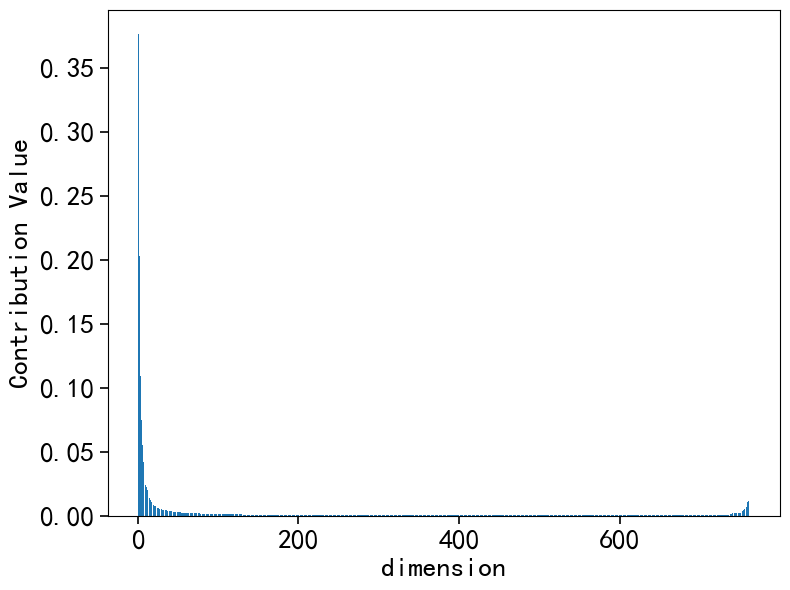

In [50]:
diff = get_positive_contributions(S)
plt.figure(figsize=(8, 6))
plt.bar(range(1,len(diff)+1), diff) 
plt.xlabel('dimension',fontsize=20,fontweight='bold', labelpad=5)
plt.ylabel('Contribution Value',fontsize=20,fontweight='bold', labelpad=5)
plt.tick_params(axis='both', labelsize=20,width=1.2, length=6 )
for label in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
    label.set_fontweight('medium')
#plt.title('positive contributions in singular spectrum')
plt.tight_layout()
plt.show()

# plt.xticks(range(1, len(diff)+1, 5))  # 每隔5个维度显示一个刻度

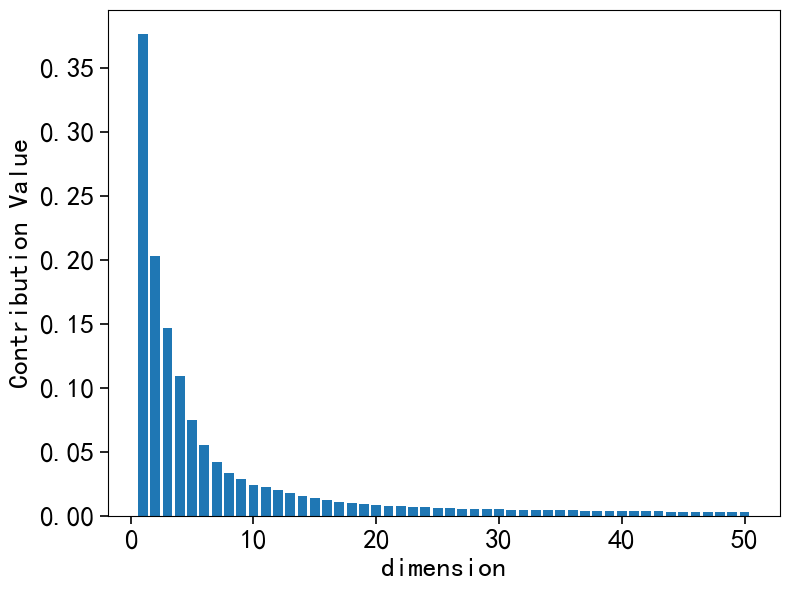

In [51]:
diff1 = diff[:50]
plt.figure(figsize=(8, 6))
plt.bar(range(1,len(diff1)+1), diff1) 
plt.xlabel('dimension',fontsize=20,fontweight='bold', labelpad=5)
plt.ylabel('Contribution Value',fontsize=20,fontweight='bold', labelpad=5)
plt.tick_params(axis='both', labelsize=20,width=1.2, length=6 )
for label in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
    label.set_fontweight('medium')
#plt.title('positive contributions in singular spectrum')
plt.tight_layout()
plt.show()

# plt.xticks(range(1, len(diff)+1, 5))  # 每隔5个维度显示一个刻度

In [52]:
print(compute_entropy(diff))

6.23855291153133


In [53]:
rank = 1
S_macro = S[:rank]
delt_gamma = sum(S_macro) / rank - sum(S) / len(S)
print(delt_gamma)

3.7012920940204146


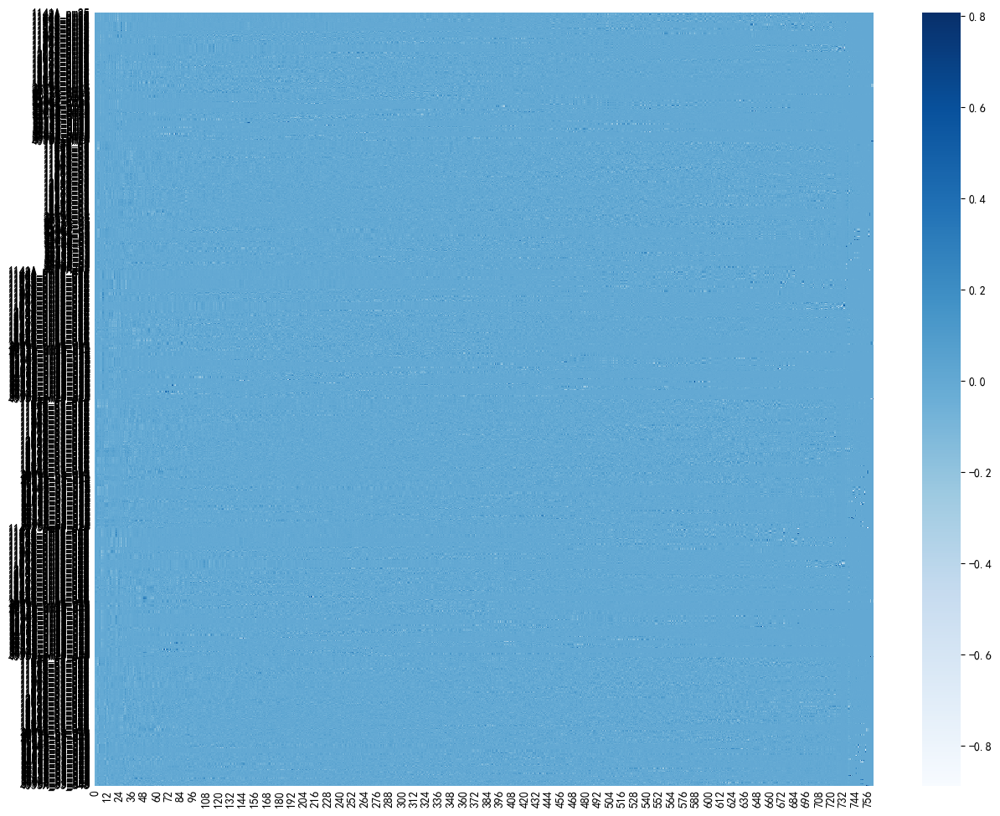

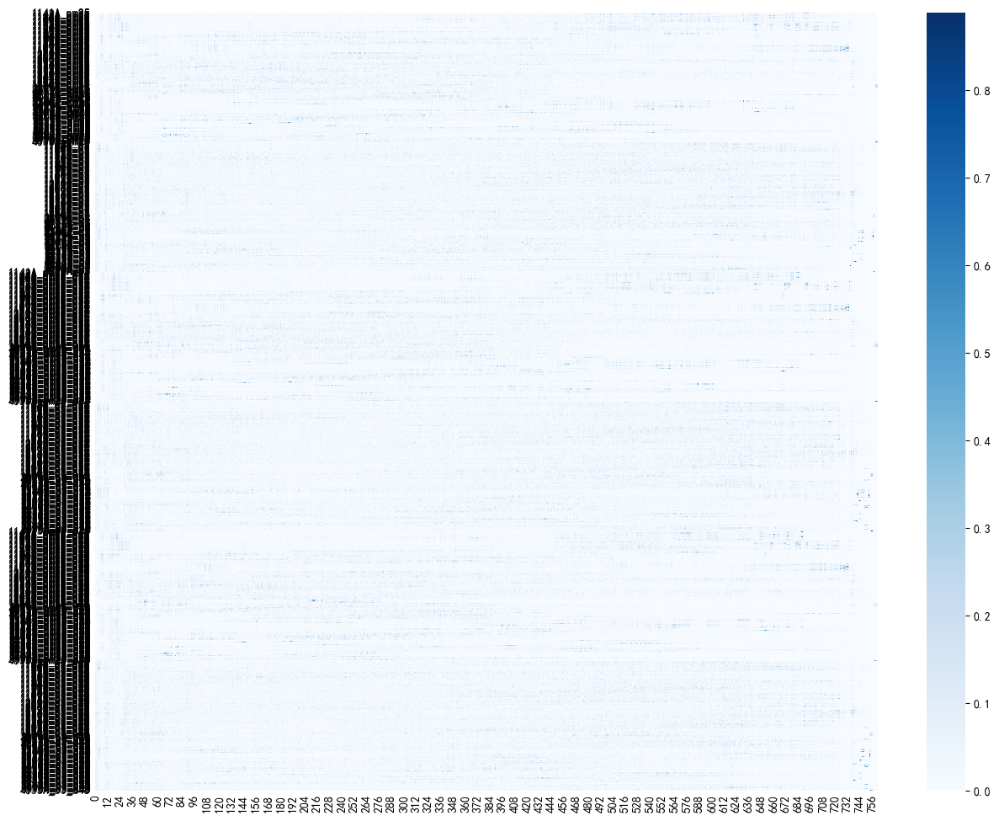

In [54]:
U_abs = np.abs(U)

plt.figure(figsize=(15, 12)) 
plt.tick_params(axis='both', which='both', length=0)
_ = sns.heatmap(U, yticklabels=new_names,cmap=cmap)
plt.xticks(rotation=90)  
plt.yticks(rotation=0)   
plt.show()


plt.figure(figsize=(15, 12)) 
plt.tick_params(axis='both', which='both', length=0)
_ = sns.heatmap(U_abs, yticklabels=new_names,cmap=cmap)
plt.xticks(rotation=90)  
plt.yticks(rotation=0)   
plt.show() 

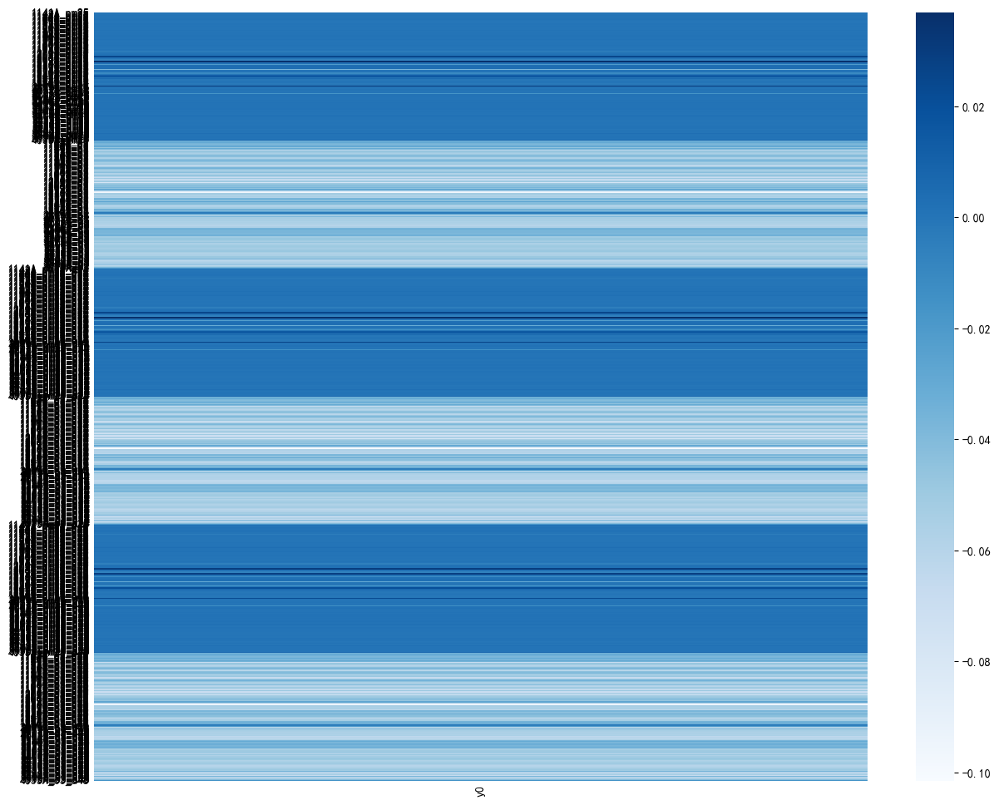

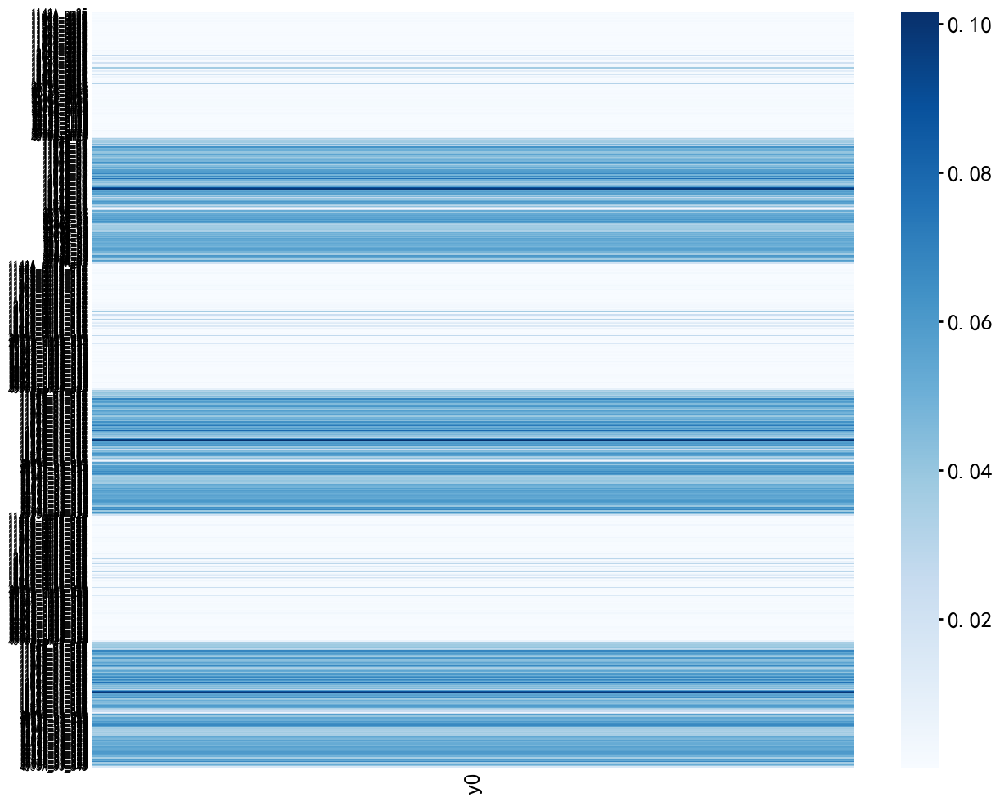

In [55]:
macro_name = [f'y{i}' for i in range(rank)]
coarse_grain_coff = U[:,:rank]

plt.figure(figsize=(15, 12)) 
plt.tick_params(axis='both', which='both', length=0)
_ = sns.heatmap(coarse_grain_coff, yticklabels=new_names, xticklabels=macro_name,cmap=cmap)
plt.xticks(rotation=90)  
plt.yticks(rotation=0)   
plt.show()


plt.figure(figsize=(15, 12)) 
plt.tick_params(axis='both', which='both', length=0)
heatmap = sns.heatmap(np.abs(coarse_grain_coff), yticklabels=new_names, xticklabels=macro_name,cmap=cmap)
plt.xticks(fontsize=20,rotation=90)  
plt.yticks(rotation=0) 
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=20, width=2) 
plt.show()

In [56]:
splits_pm25, splits_o3 = split_and_group_matrices(U_abs[:, :rank], new_names, n_delays+1)
len(splits_pm25)

3

In [57]:
vmax = np.max(U_abs[:, :rank])
vmin = np.min(U_abs[:, :rank])

PM2.5------------------------------------------------------------------------------------------------------------------------


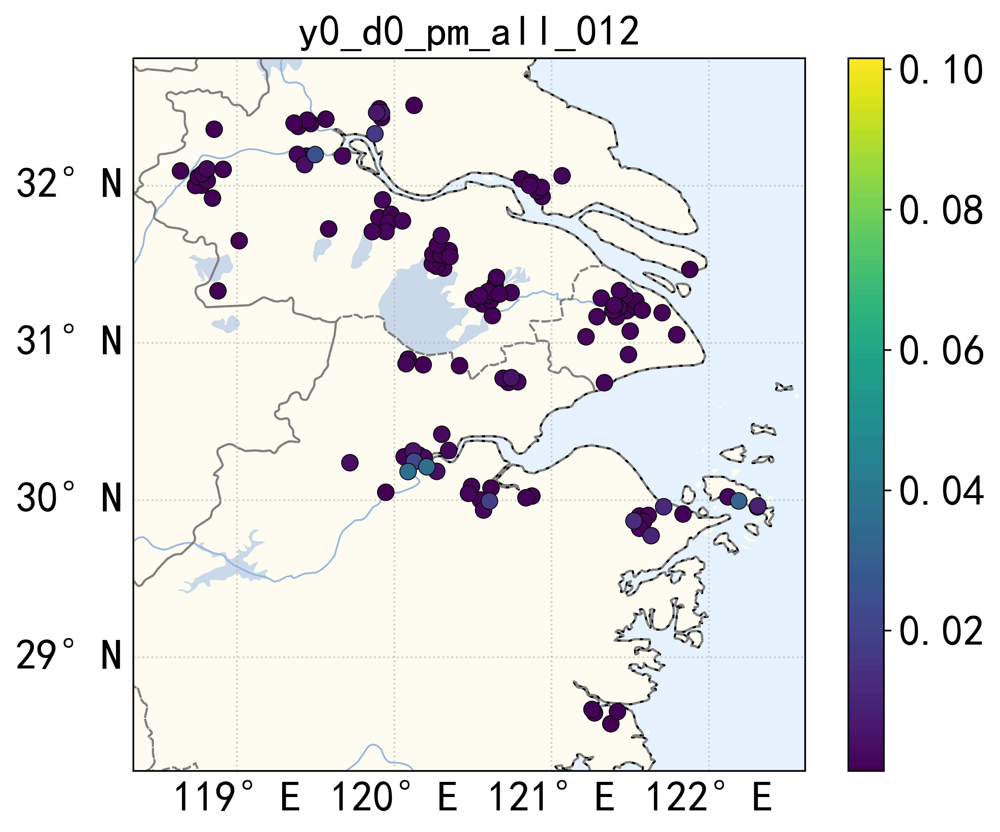

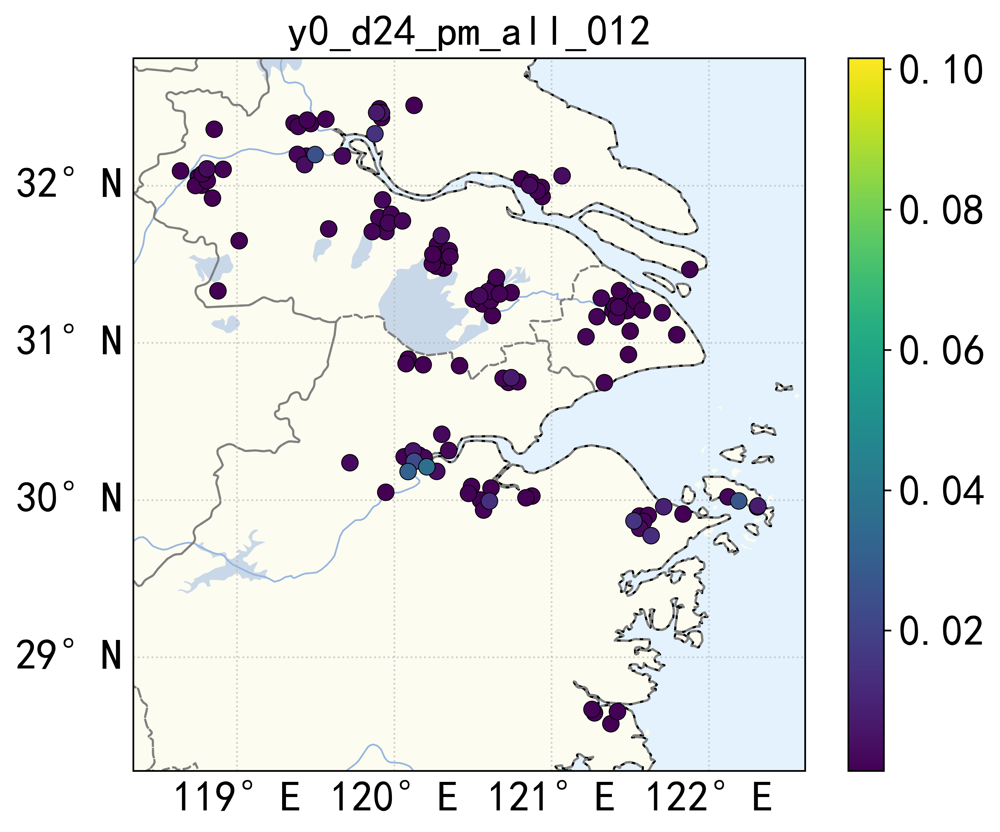

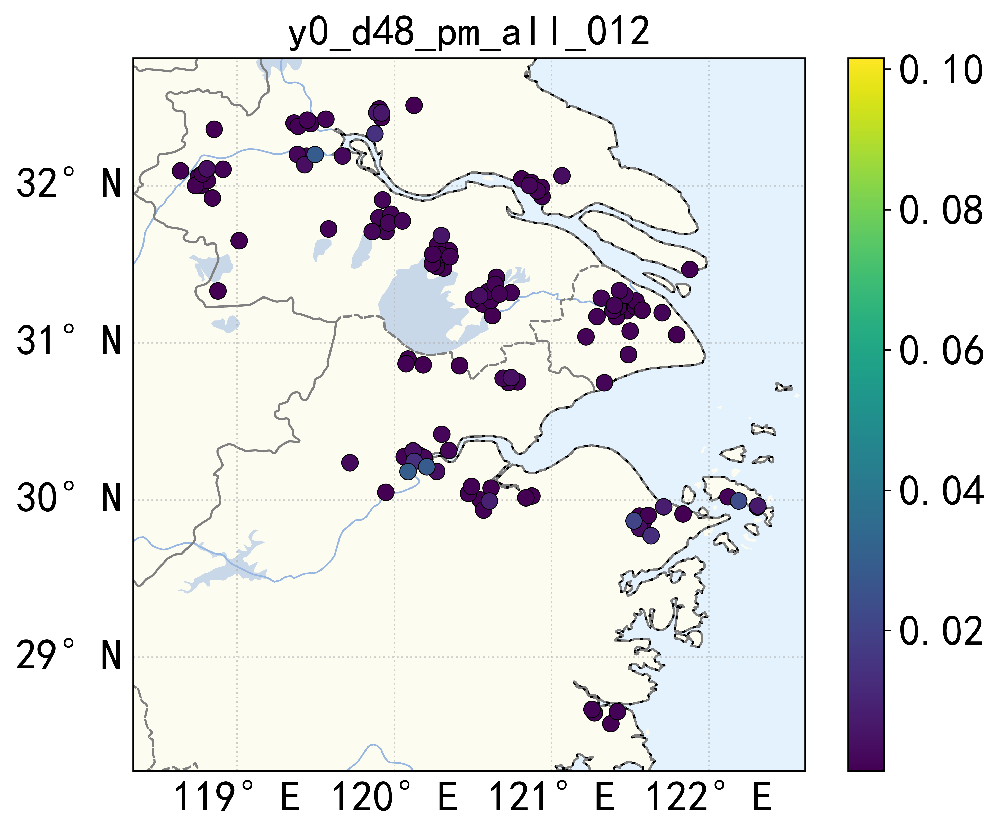

O3------------------------------------------------------------------------------------------------------------------------


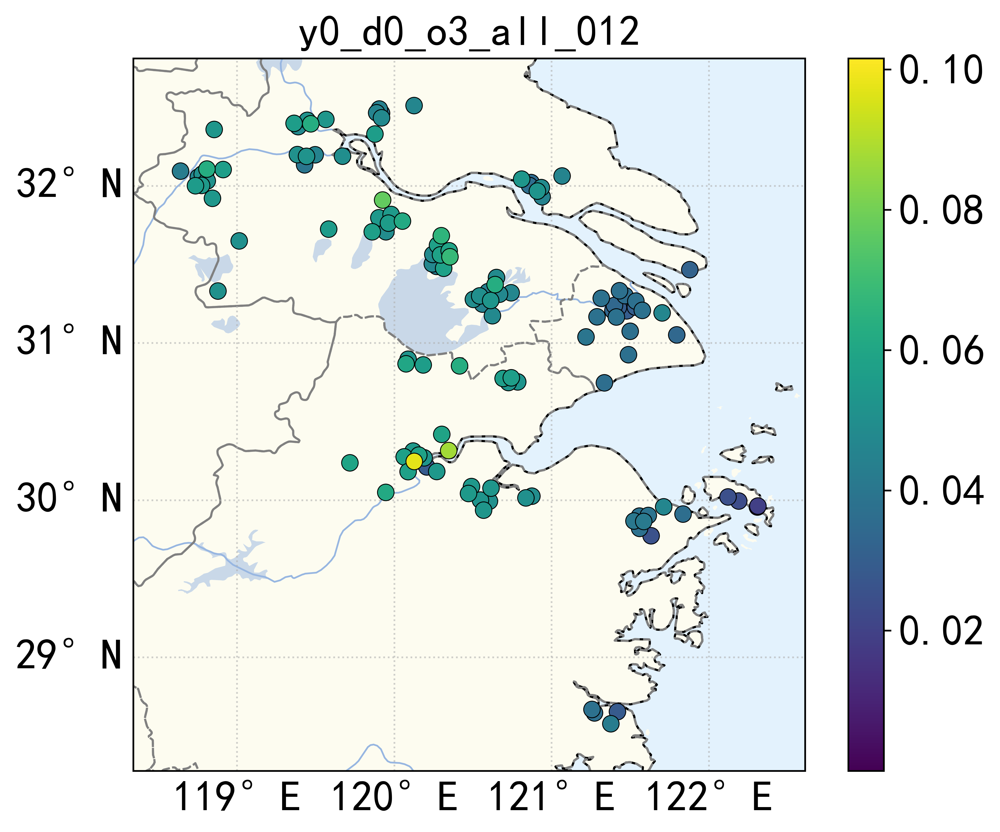

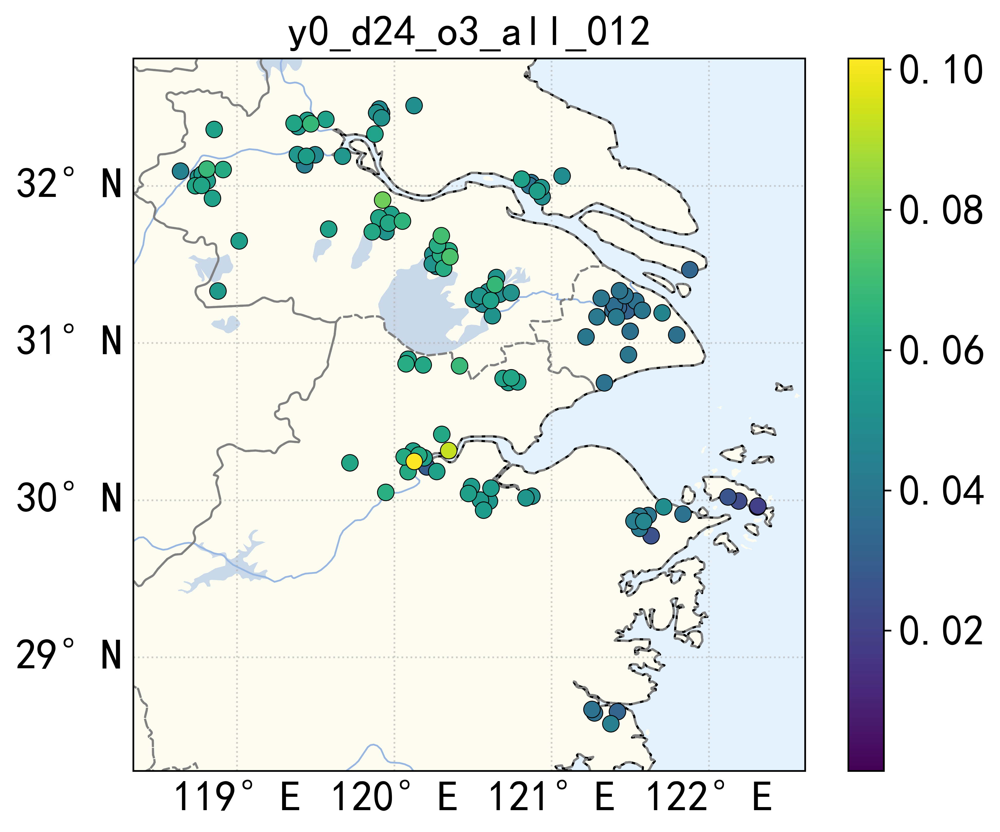

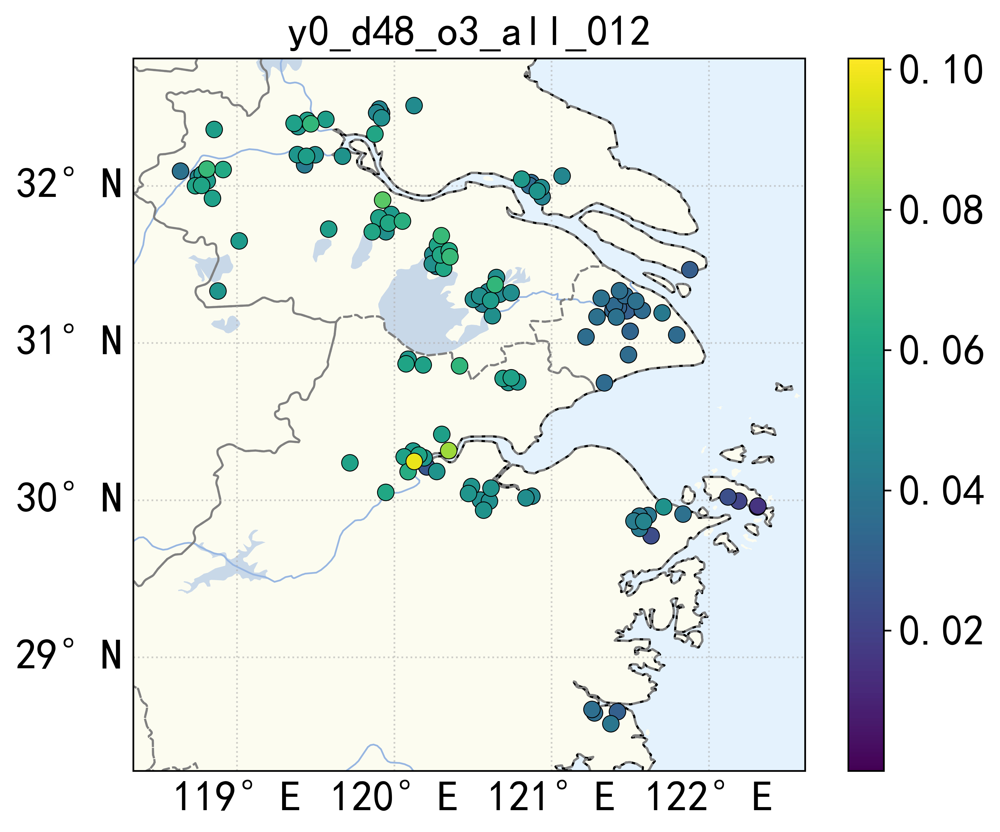

In [58]:
print("PM2.5" + '-' * 120)
for i,cg in enumerate(splits_pm25):
    plot_station_with_map(df, cg, delay=i*delay_interval, title_suffix="_pm_all_012",vmax=vmax,vmin=vmin)

print("O3" + '-' * 120)
for i,cg in enumerate(splits_o3):
    plot_station_with_map(df, cg, delay=i*delay_interval, title_suffix="_o3_all_012",vmax=vmax,vmin=vmin)

In [59]:
coarse_grain_coff = U_abs[:, :rank]
print_equations(coarse_grain_coff, new_names, macro_name)

y0 = 0.0012 * 1141A_pm25 + 0.0000 * 1142A_pm25 + 0.0008 * 1143A_pm25 + 0.0003 * 1144A_pm25 + 0.0001 * 1145A_pm25 + 0.0010 * 1147A_pm25 + 0.0013 * 1148A_pm25 + 0.0000 * 1149A_pm25 + 0.0001 * 1150A_pm25 + 0.0018 * 1151A_pm25 + 0.0001 * 1152A_pm25 + 0.0005 * 1153A_pm25 + 0.0001 * 1154A_pm25 + 0.0004 * 1155A_pm25 + 0.0000 * 1156A_pm25 + 0.0001 * 1157A_pm25 + 0.0001 * 1158A_pm25 + 0.0008 * 1159A_pm25 + 0.0001 * 1160A_pm25 + 0.0004 * 1162A_pm25 + 0.0005 * 1163A_pm25 + 0.0002 * 1164A_pm25 + 0.0009 * 1165A_pm25 + 0.0007 * 1166A_pm25 + 0.0001 * 1167A_pm25 + 0.0004 * 1168A_pm25 + 0.0013 * 1169A_pm25 + 0.0001 * 1170A_pm25 + 0.0001 * 1171A_pm25 + 0.0001 * 1172A_pm25 + 0.0005 * 1186A_pm25 + 0.0001 * 1188A_pm25 + 0.0007 * 1189A_pm25 + 0.0003 * 1190A_pm25 + 0.0002 * 1191A_pm25 + 0.0006 * 1192A_pm25 + 0.0009 * 1193A_pm25 + 0.0003 * 1194A_pm25 + 0.0031 * 1195A_pm25 + 0.0010 * 1196A_pm25 + 0.0010 * 1200A_pm25 + 0.0019 * 1201A_pm25 + 0.0012 * 1203A_pm25 + 0.0253 * 1204A_pm25 + 0.0032 * 1205A_pm25 + 0.000

In [60]:
print_equations(coarse_grain_coff, new_names, macro_name, threshold=0.05)

y0 = 0.0628 * 1151A_o3 + 0.0505 * 1153A_o3 + 0.0547 * 1154A_o3 + 0.0511 * 1155A_o3 + 0.0553 * 1158A_o3 + 0.0566 * 1159A_o3 + 0.0532 * 1164A_o3 + 0.0502 * 1165A_o3 + 0.0627 * 1167A_o3 + 0.0527 * 1168A_o3 + 0.0533 * 1172A_o3 + 0.0573 * 1189A_o3 + 0.0584 * 1190A_o3 + 0.0587 * 1192A_o3 + 0.0682 * 1193A_o3 + 0.0661 * 1195A_o3 + 0.0555 * 1196A_o3 + 0.0770 * 1201A_o3 + 0.0573 * 1224A_o3 + 0.0875 * 1226A_o3 + 0.0975 * 1227A_o3 + 0.0528 * 1228A_o3 + 0.0547 * 1230A_o3 + 0.0588 * 1231A_o3 + 0.0543 * 1232A_o3 + 0.0579 * 1233A_o3 + 0.0506 * 1247A_o3 + 0.0601 * 1250A_o3 + 0.0564 * 1252A_o3 + 0.0528 * 1253A_o3 + 0.0520 * 2869A_o3 + 0.0522 * 2870A_o3 + 0.0527 * 2872A_o3 + 0.0524 * 2873A_o3 + 0.0561 * 2907A_o3 + 0.0526 * 2921A_o3 + 0.0562 * 2997A_o3 + 0.0551 * 3002A_o3 + 0.0613 * 3003A_o3 + 0.0540 * 3010A_o3 + 0.0630 * 3164A_o3 + 0.0561 * 3195A_o3 + 0.0510 * 3287A_o3 + 0.0532 * 3294A_o3 + 0.0561 * 3407A_o3 + 0.0531 * 3408A_o3 + 0.0541 * 3409A_o3 + 0.0505 * 3411A_o3 + 0.0536 * 3422A_o3 + 0.0505 * 3423A_

In [61]:
print_equations(coarse_grain_coff, new_names, macro_name, threshold=0.08)

y0 = 0.0875 * 1226A_o3 + 0.0975 * 1227A_o3 + 0.0927 * 1226A_o3_d24 + 0.1015 * 1227A_o3_d24 + 0.0868 * 1226A_o3_d48 + 0.0983 * 1227A_o3_d48
------------------------------


In [62]:
macro_data = H @ coarse_grain_coff
macro_dim = macro_data.shape[1]

C:\Users\Administrator.DESKTOP-BFUOLPM\AppData\Local\Temp\ipykernel_36204\2526092834.py:6: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


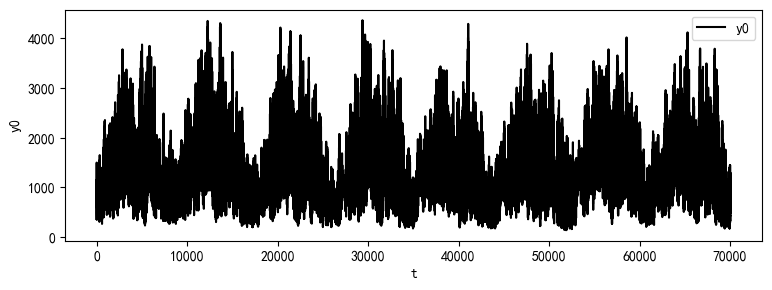

In [63]:
fig, axs = plt.subplots(macro_dim, 1, sharex=True, figsize=(9, int(3*macro_dim)))
for i in range(macro_dim):
    axs.plot(macro_data[:, i], "k", label=f"y{i}")
    axs.legend()
    axs.set(xlabel="t", ylabel=f"y{i}")
fig.show()

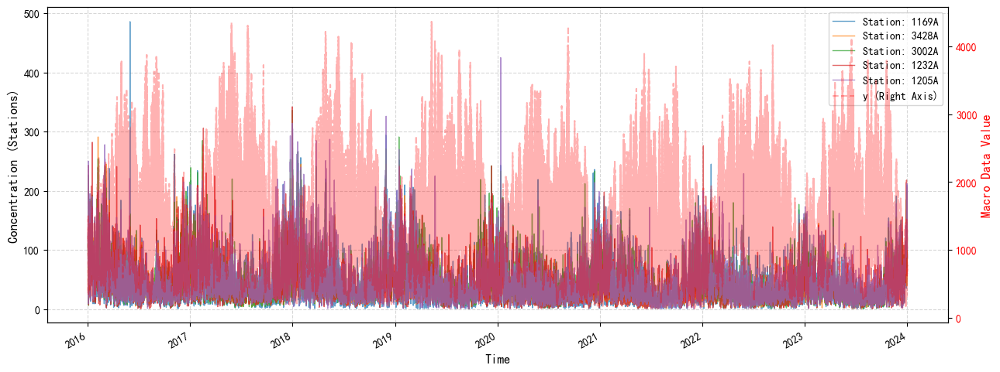

In [64]:
plot_macro_serie(pm25, macro_data[:, 0], n_delays, delay_interval, times, selected_indices, stations)

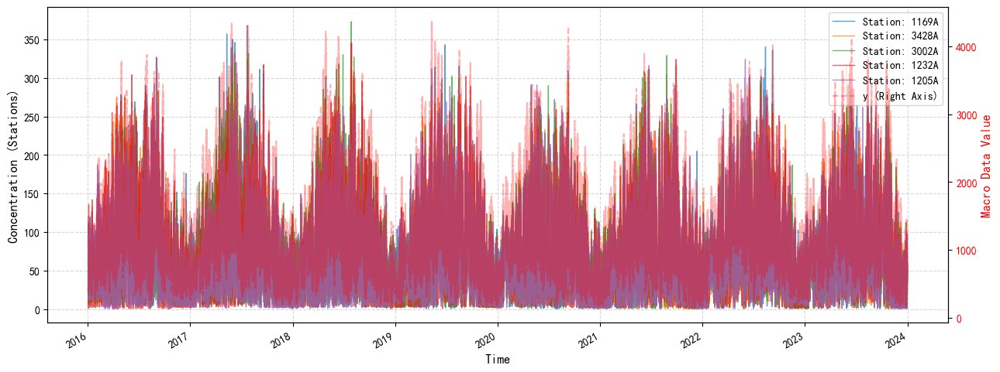

In [65]:
plot_macro_serie(o3, macro_data[:, 0], n_delays, delay_interval, times, selected_indices, stations)